# Import Libraries

In [1]:
import pandas as pd
import numpy as np

import requests
import seaborn as sns

import scipy
import scipy.optimize as op
from scipy.stats import linregress
from scipy.optimize import curve_fit
from scipy import stats

from datetime import date, timedelta
import datetime

import statsmodels.api as sm
from statsmodels.sandbox.regression.predstd import wls_prediction_std

from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline

from sklearn.covariance import EmpiricalCovariance, MinCovDet

import dask.dataframe as dd

import pathlib

from pylab import rcParams
rcParams['figure.figsize'] = 12, 10
rcParams['pdf.fonttype'] = 42
inline_rc = dict(plt.rcParams)

#from matplotlib.pyplot import cm 
import platform
import sys
import glob
import io
import os

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go

init_notebook_mode(connected=True)

Import development version of micromet.

In [2]:
mmpath = "G:/Shared drives/UGS_Groundwater/Projects/Eddy_Covariance/Data_Processing/Jupyter_Notebooks/MicroMet"
sys.path.append(mmpath)
import micromet as ec

Print versions of for troubleshooting and version checking.

In [3]:
print("Operating System " + platform.system() + " " + platform.release())
print("Python Version " + str(sys.version))
print("Pandas Version " + str(pd.__version__))
print("Numpy Version " + str(np.__version__))
print("Matplotlib Version " + str(matplotlib.__version__))
#print("Well Application Version " + str(wa.__version__))
print("Scipy Version " +str(scipy.__version__))
print("Micromet Version "+str(ec.__version__))
print (os.environ['CONDA_DEFAULT_ENV'])

Operating System Windows 10
Python Version 3.9.13 | packaged by conda-forge | (main, May 27 2022, 16:51:29) [MSC v.1929 64 bit (AMD64)]
Pandas Version 1.4.3
Numpy Version 1.23.2
Matplotlib Version 3.5.3
Scipy Version 1.8.1
Micromet Version 0.1.0
et-time


In [4]:
def plotlystuff(datasets, colnames, chrttypes=None, datatitles=None, chrttitle = 'well', colors=None,
                two_yaxes = False, axisdesig= None, axislabels=['Levels','Barometric Pressure'],opac=None):
    
    if chrttypes is None:
        chrttypes = ['lines']*len(datasets)

    if opac is None:
        opac = [0.8]*len(datasets)
        
    if datatitles is None:
        datatitles = colnames
    
    if axisdesig is None:
        axisdesig = ['y1']*len(datasets)
        
    if colors is None:
        if len(datasets) <= 5: 
            colors = ['#228B22','#F7DC6F','#FF1493','#663399','#FF0000']
        else:
            colors = []
            for i in range(len(datasets)):
                colors[i] = '#{:02x}{:02x}{:02x}'.format(r(), r(), r())
        
    r = lambda: random.randint(0,255)
    
    modetypes = ['markers','lines+markers','lines']
    datum = {}
    
    for i in range(len(datasets)):
        datum['d' + str(i)] = go.Scatter(
            x=datasets[i].index,
            y=datasets[i][colnames[i]],
            name = datatitles[i],
            line = dict(color = colors[i]),
            mode = chrttypes[i],
            opacity = opac[i],
            yaxis = axisdesig[i])
        
    data = list(datum.values())

    layout = dict(
        title=chrttitle,
        xaxis=dict(
            rangeslider=dict(
                visible = True
            ),
            type='date',
            tickformat='%Y-%m-%d %H:%M'
        ),
        yaxis=dict(title=axislabels[0],
                   titlefont=dict(color='#1f77b4'),
                   tickfont=dict(color='#1f77b4')),
    )
    
    
    if two_yaxes:
        layout['yaxis2'] = dict(title=axislabels[1], titlefont=dict(color='#ff7f0e'),
                    tickfont=dict(color='#ff7f0e'),
                    anchor='x',
                    overlaying='y',
                    side='right',
                    position=0.15)

    fig = dict(data=data, layout=layout)
    iplot(fig, filename = 'well')
    return 

In [5]:
def rolling_smooth(df, p, win=12, upper_threshold = 5, lower_threshold = -1):
    # https://stackoverflow.com/questions/62692771/outlier-detection-based-on-the-moving-mean-in-python
    # Set threshold for difference with rolling median

    # Calculate rolling median
    df['rolling_temp'] = df[p].rolling(window=win).median()

    # Calculate difference
    df['diff'] = df[p] - df['rolling_temp']

    # Flag rows to be dropped as `1`
    df['drop_flag'] = np.where((df['diff']>upper_threshold)|(df['diff']<lower_threshold),1,0)

    # Drop flagged rows
    df[p+'_ds'] = df[p]
    df.loc[df['drop_flag']==1,p+'_ds'] = None
    df[p+'_ds'] = df[p+'_ds'].interpolate()
    df = df.drop(['rolling_temp', 'rolling_temp', 'diff', 'drop_flag'],axis=1)
    return df

#data = rolling_smooth(data, 'T_SONIC')

# Define Working Directory

In [6]:
toa_path = pathlib.Path("Q:/ET/Wellington/TOA")

# Initiate CalcFlux Class and test with basic function

In [7]:
fluxcalc = ec.CalcFlux()
print(fluxcalc.calc_Tsa_air_temp_sonic(291.5,0.8))


207.03125


# Import Data

## Multiple File Import

In [10]:
dfs = {}
i=0
for file in toa_path.glob("*Time_Series_45*"):
    print(file)
    df = dd.read_csv(file,skiprows=[0,2,3],na_values=['NAN'],dtype={'diag_csat': 'float64'},
                 parse_dates=True).set_index('TIMESTAMP')
    #df['Pr'] = 86000

    df.index = df.index.astype('M8[ns]')
    dfs[i] = df.compute()
    i+=1

Q:\ET\Wellington\TOA\TOA5_23861_Time_Series_450.dat
Q:\ET\Wellington\TOA\TOA5_23861_Time_Series_451.dat
Q:\ET\Wellington\TOA\TOA5_23861_Time_Series_452.dat
Q:\ET\Wellington\TOA\TOA5_23861_Time_Series_453.dat


In [11]:
raw_data = pd.concat(dfs).droplevel(0)

output_interval = '30min'
srt_date = pd.to_datetime('2022-05-16 10:30:00.05')
end_date = srt_date + pd.Timedelta(output_interval) - pd.Timedelta('50 milliseconds')

data = raw_data[srt_date:end_date]
data = fluxcalc.renamedf(data)
print(len(data))

36000


In [20]:
# Find the Mean Squared Error of Velocity Components and Humidity
fluxcalc.UxMSE = fluxcalc.calc_MSE(data['Ux'])
fluxcalc.UyMSE = fluxcalc.calc_MSE(data['Uy'])
fluxcalc.UzMSE = fluxcalc.calc_MSE(data['Uz'])
fluxcalc.QMSE = fluxcalc.calc_MSE(data['Q'])

In [21]:
fluxcalc.covar_coord_rot_correction(cosν, sinν, sinTheta, cosTheta)

In [23]:
pathlen, wind_compass = fluxcalc.determine_wind_dir(data['Ux'].mean(),data['Uy'].mean())

In [25]:
wind_compass

138.07541039242903

In [26]:
StDevUz = data['Uz'].std()
UMean = data['Ux'].mean() * cosTheta * cosν + data['Uy'].mean() * cosTheta * sinν + data['Uz'].mean() * sinTheta

In [27]:
def freq_response_correction(Umean, pathlen=0):
    # Frequency Response Corrections (Massman, 2000 & 2001)
    tauB = 3600 / 2.8
    tauEKH20 = np.sqrt((0.01 / (4 * UMean)) ** 2 + (pathlen / (1.1 * UMean)) ** 2)
    tauETs = np.sqrt((0.1 / (8.4 * UMean)) ** 2)
    tauEMomentum = np.sqrt((0.1 / (5.7 * UMean)) ** 2 + (0.1 / (2.8 * UMean)) ** 2)
    return tauB, tauEKH20, tauETs, tauEmomentum

tauB, tauEKH20, tauETs, tauEmomentum = freq_response_correction(UMean)


NameError: name 'Umean' is not defined

In [ ]:
fluxcalc.determine_wind_dir(fluxcalc.avgvals)

In [45]:
fluxcalc.covar['Uz-pV']/

{'Ux-Ux': 1.59329828,
 'Ux-Uy': 1.58352546,
 'Ux-Uz': 2.453401564609275,
 'Ux-Ts': 1.58352546,
 'Ux-Tsa': 1.58352546,
 'Ux-pV': 1.58352546,
 'Ux-Q': 2.4378343055616405,
 'Ux-Sd': 1.58352546,
 'Uy-Ux': 2.35697417,
 'Uy-Uy': 2.36519014,
 'Uy-Uz': -2.3329102784600106,
 'Uy-Ts': 2.35697417,
 'Uy-Tsa': 2.35697417,
 'Uy-pV': 2.35697417,
 'Uy-Q': -2.227127333818831,
 'Uy-Sd': 2.35697417,
 'Uz-Ux': 0.10521126,
 'Uz-Uy': 0.14216222,
 'Uz-Uz': 0.11319647,
 'Uz-Ts': 0.10521126,
 'Uz-Tsa': 0.12038293871557285,
 'Uz-pV': 0.16096591302424854,
 'Uz-Q': 0.09218479094914155,
 'Uz-Sd': 0.12038293871557285,
 'Ts_Q': 0.19037227,
 'Uxy-Uz': 3.385505812219439}

In [ ]:
Uz_pV = (CovUz_LnKH / XKw) / 1000

## Single File Import

In [ ]:

file= fileplace + "*Time_Series_290.dat"
df = dd.read_csv(file,skiprows=[0,2,3],na_values=['NAN'],dtype={'diag_csat': 'float64'},
                 parse_dates=True).set_index('TIMESTAMP')
#df['Pr'] = 86000

df.index = df.index.astype('M8[ns]')
df = df.compute()
df['TA_1_1_1'] = df['TA_1_1_1'] + 23 
df['T_SONIC'] = df['TA_1_1_1']
#df = df.loc[pd.to_datetime("2009-05-27 16:00:00.000"):]

In [ ]:
df.head()

# Using the Class

In [ ]:
fluxcalc = ec.CalcFluxWithKH20()

In [ ]:
print(fluxcalc.calc_E_vapor_pressure(3.4,290.2))

In [ ]:
#dfsm = df.loc[pd.to_datetime("2009-05-27 16:00:00.000"):pd.to_datetime("2009-05-27 17:00:00.000")]

In [ ]:
agmet = pd.read_csv(r"C:\Users\paulinkenbrandt\Downloads\UCC_scan_2137_2021_06_08_1623185624\UCC_scan_2137_2021_06_08_1623185624.csv",
            skiprows=14,na_values=['M','S'],index_col='Day',parse_dates=True)


In [ ]:
df['Ta_K'] = fluxcalc.convert_CtoK(df['TA_1_1_1'])

In [ ]:
df['Ta_C'] = fluxcalc.convert_KtoC(df['Ta_K'])
df['Ta_C'].plot()

In [ ]:
outdf = {}
for i, g in df.groupby(pd.Grouper(freq='1H')):
    outdf[g.first_valid_index()] = fluxcalc.runall(g)
    print(g.first_valid_index())
    print(outdf[g.first_valid_index()])
    #print(i)

In [ ]:
pd.concat(outdf,axis=1).T['ET'].plot()#.to_clipboardboard()

In [ ]:
pd.concat(outdf,axis=1).T.to_csv("G:/My Drive/Python/Pycharm/MicroMet/output.csv")#.reset_index().set_index('Firstdate')

# Step by Step

## Import data

In [8]:
dfs = {}
i=0
for file in toa_path.glob("*Time_Series_45*"):
    print(file)
    df = dd.read_csv(file,skiprows=[0,2,3],na_values=['NAN'],dtype={'diag_csat': 'float64'},
                 parse_dates=True).set_index('TIMESTAMP')
    #df['Pr'] = 86000

    df.index = df.index.astype('M8[ns]')
    dfs[i] = df.compute()
    i+=1

Q:\ET\Wellington\TOA\TOA5_23861_Time_Series_450.dat
Q:\ET\Wellington\TOA\TOA5_23861_Time_Series_451.dat
Q:\ET\Wellington\TOA\TOA5_23861_Time_Series_452.dat
Q:\ET\Wellington\TOA\TOA5_23861_Time_Series_453.dat


## Subset data sample

In [9]:
raw_data = pd.concat(dfs).droplevel(0)

output_interval = '30min'
srt_date = pd.to_datetime('2022-05-16 10:30:00.05')
end_date = srt_date + pd.Timedelta(output_interval) - pd.Timedelta('50 milliseconds')

data = raw_data[srt_date:end_date]

## Initiate Class

In [10]:
fluxcalc = ec.CalcFlux()
print(fluxcalc.calc_Tsa_air_temp_sonic(291.5,0.8))

207.03125


## Constants

In [11]:
print(f"Water Vapor Gas Constant {fluxcalc.Rv} J/[kg*K]")
print(f"Universal Gas Constant {fluxcalc.Ru} J/[kg*K]")
print(f"Specific Heat of Dry Air {fluxcalc.Cpd} J/[kg*K]")
print(f"Dry Air Gas Constant {fluxcalc.Rd} J/[kg*K]")
print(f"Molar Fraction of Oxygen in the Atmosphere {fluxcalc.Co}")
print(f"Molar Mass of Oxygen (gO2/mole) {fluxcalc.Mo}")
print(f"Sonic Direction {fluxcalc.sonic_dir} degrees")

print(f"{fluxcalc.meter_type}")
print(f"Height of Sonic Anemometer above Ground Surface = {fluxcalc.UHeight} m")
print(f"Separation Distance Between Sonic Anemometer and IRGASON = {fluxcalc.PathDist_U} m")


Water Vapor Gas Constant 461.51 J/[kg*K]
Universal Gas Constant 8.3143 J/[kg*K]
Specific Heat of Dry Air 1005.0 J/[kg*K]
Dry Air Gas Constant 287.05 J/[kg*K]
Molar Fraction of Oxygen in the Atmosphere 0.21
Molar Mass of Oxygen (gO2/mole) 0.032
Sonic Direction 225 degrees
IRGASON
Height of Sonic Anemometer above Ground Surface = 3.52 m
Separation Distance Between Sonic Anemometer and IRGASON = 0.0 m


## Rename Data

In [12]:
data = fluxcalc.renamedf(data)
print(len(data))

36000


In [13]:
print(data.columns)

Index(['RECORD', 'Ux', 'Uy', 'Uz', 'Ts', 'diag_sonic', 'CO2_density',
       'CO2_density_fast_tmpr', 'pV', 'diag_irga', 'T_SONIC_corr', 'Ta', 'Pr',
       'CO2_sig_strgth', 'H2O_sig_strgth'],
      dtype='object')


## Preliminary Data Check

In [14]:
print(f"Mean Uz = {data['Uz'].mean():0.2f}")
print(f"Mean Ux = {data['Ux'].mean():0.2f}")
print(f"Mean Uy = {data['Uy'].mean():0.2f}")

data.index.freq = '50L'
print(f"Measurement freq= {data.index.freq}")
print(len(data))
print(f"{20*60*60*24} measurements per day \n {20*60*60} measurements per hour \n {20*60} measurements per minute")

Mean Uz = -0.01
Mean Ux = 0.11
Mean Uy = 1.70
Measurement freq= <50 * Millis>
36000
1728000 measurements per day 
 72000 measurements per hour 
 1200 measurements per minute


## Despike

https://github.com/icos-etc/RFlux/blob/2c74e7e6d921636e05fcb7bec8e387b52454527d/R/despiking.R<br>
https://github.com/icos-etc/RFlux/blob/2c74e7e6d921636e05fcb7bec8e387b52454527d/R/robf_despiking.R

https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.medfilt.html<br>
https://www.eol.ucar.edu/content/despiking-algorithm<br>
https://github.com/icos-etc/RFlux/blob/2c74e7e6d921636e05fcb7bec8e387b52454527d/R/robf_despiking.R<br>
https://www.nature.com/articles/s41598-021-91002-y#data-availability%C2%A0and-software

In [15]:
smooth_fields = ['Ux', 'Uy', 'Uz', 'Ts', 'CO2_density', 'CO2_density_fast_tmpr', 
                 'H2O_density', 'T_SONIC_corr', 'Ta', 'Pr', 'pV']
for field in smooth_fields:
    if field in data.columns:
        data[field + '_ro'] = fluxcalc.despike_med_mod(data[field])

In [16]:

data['Pr_rom'] = fluxcalc.despike_med_mod(data['Pr'],win=1200)
data['Pr_ro_m'] = fluxcalc.despike_quart_filter(data['Pr'],win=800)

plotlystuff([data, data,data],['Pr','Pr_rom','Pr_ro_m'])

## CSAT Correction

In [17]:
# Remove shadow effects of the CSAT (this is also done by the CSAT Firmware)
data['Ux'], data['Uy'], data['Uz'] = fluxcalc.shadow_correction(data['Ux_ro'].to_numpy(),
                                                                data['Uy_ro'].to_numpy(),
                                                                data['Uz_ro'].to_numpy())

## Weather Parameters

In [18]:
data['Ts_K'] = fluxcalc.convert_CtoK(data['Ts_ro'])
# smooth pV
#data = rolling_smooth(data, 'PA',win=20, upper_threshold=4, lower_threshold=-4)
# convert pV to g/m-3
data['e'] = fluxcalc.calc_E_vapor_pressure(data['pV_ro']*0.001,data['Ts_K'])
# convert air pressure from kPa to Pa
data['Q'] = fluxcalc.calc_Q_specific_humidity(data['Pr_ro']*1000.,data['e'])
data['Tsa'] = fluxcalc.calc_Tsa_air_temp_sonic(data['Ts_K'],data['Q'])
#data['Ta'] = fluxcalc.convert_KtoC(data['Ta'])
data['es'] = fluxcalc.calc_Es_sat_vapor_pressure(data['Tsa'])
data['Sd'] = fluxcalc.calc_Q_specific_humidity(data['Pr_ro'], fluxcalc.calc_Es_sat_vapor_pressure(data['Tsa'])) - data['Q']
data['lamb'] = fluxcalc.calc_latent_heat_of_vaporization(data['Tsa'],units='K')

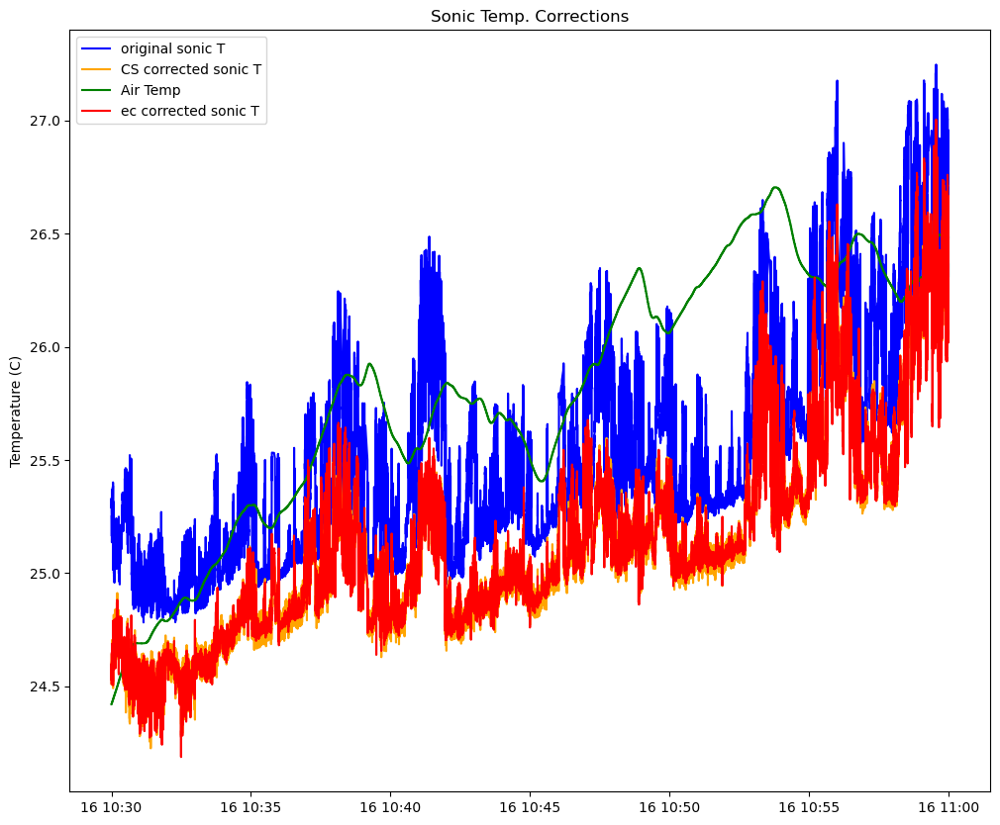

In [19]:
plt.plot(data.index,
         data['Ts_ro'],
         color='blue',
         label='original sonic T')
plt.plot(data.index,
         data['T_SONIC_corr_ro'],
         color='orange',
         label='CS corrected sonic T')
plt.plot(data.index,
         data['Ta'],
         color='green',
         label='Air Temp',zorder=30,linewidth=1.5)
plt.plot(data.index,
         fluxcalc.convert_KtoC(data['Tsa']),
         color='red',label='ec corrected sonic T', zorder=50)
#plt.plot(data.loc['2022-05-16 09:00':'2022-05-16 12:00'].index,data.loc['2022-05-16 09:00':'2022-05-16 12:00','T_SONIC_ds'],
#        color='red',zorder=30)
plt.ylabel('Temperature (C)')
plt.title('Sonic Temp. Corrections')
plt.legend()

## Covariances

### regular covariance

In [20]:
fluxcalc.calc_covar(data['Ux'],data['Uy'],data['Uz'],data['Ts'],data['Q'],data['pV'])

In [21]:
print(fluxcalc.covar)

{'Ts_Ts': 0.35165446420742963, 'Ux_Ux': 1.593298281978336, 'Uy_Uy': 2.3651901413024676, 'Uz_Uy': 0.11319646899716433, 'Q_Q': 1.1102742507465596e-06, 'pV_pV': 1.2194542579498195}


In [22]:
CovTs_Ts = data[['Ts', 'Ts']].cov().iloc[0,0] # location index needed because of same fields
CovUx_Uy = data[['Ux', 'Uy']].cov().loc['Ux', 'Uy']  # CalcCovariance(IWP.Ux, IWP.Uy)
CovUx_Uz = data[['Ux', 'Uz']].cov().loc['Ux', 'Uz']  # CalcCovariance(IWP.Ux, IWP.Uz)
CovUy_Uz = data[['Uy', 'Uz']].cov().loc['Uy', 'Uz']  # CalcCovariance(IWP.Uy, IWP.Uz)

In [23]:
print(f"CovTs_Ts = {CovTs_Ts}") 
print(f"CovUx_Uy = {CovUx_Uy}")
print(f"CovUx_Uz = {CovUx_Uz}")
print(f"CovUy_Uz = {CovUy_Uz}")

CovTs_Ts = 0.35165446420747976
CovUx_Uy = 0.6272630379923566
CovUx_Uz = -0.0400216313521045
CovUy_Uz = -0.1420747806617844


### Max covariance

In [24]:
# Calculate max variance to close separation between sensors
velocities = {"Ux": data["Ux"].to_numpy(),
              "Uy": data["Uy"].to_numpy(),
              "Uz": data["Uz"].to_numpy()}

covariance_variables = {"Ux": data["Ux"].to_numpy(),
                        "Uy": data["Uy"].to_numpy(),
                        "Uz": data["Uz"].to_numpy(),
                        "Ts": data["Ts_K"].to_numpy(),
                        "Tsa": data["Tsa"].to_numpy(),
                        "pV": data["pV"].to_numpy(),
                        "Q": data["Q"].to_numpy(),
                        "Sd": data["Sd"].to_numpy()}

# This iterates through the velocities and calculates the maximum covariance between
# the velocity and the other variables
for ik, iv in velocities.items():
    for jk, jv in covariance_variables.items():
        fluxcalc.covar[f"{ik}-{jk}"] = fluxcalc.calc_max_covariance(iv, jv)[0][1]
        print(f"{ik}-{jk} = {fluxcalc.calc_max_covariance(iv, jv)[0][1]:0.3f}   Lag = {fluxcalc.calc_max_covariance(iv, jv)[0][0]} timestep")
        
fluxcalc.covar["Ts_Q"] = fluxcalc.calc_max_covariance(data['Tsa'], data['Q'])[0][1]

Ux-Ux = 1.593   Lag = 0 timestep
Ux-Uy = 1.584   Lag = -1 timestep
Ux-Uz = 1.584   Lag = -1 timestep
Ux-Ts = 1.584   Lag = -1 timestep
Ux-Tsa = 1.584   Lag = -1 timestep
Ux-pV = 1.584   Lag = -1 timestep
Ux-Q = 1.584   Lag = -1 timestep
Ux-Sd = 1.584   Lag = -1 timestep
Uy-Ux = 2.357   Lag = -1 timestep
Uy-Uy = 2.365   Lag = 0 timestep
Uy-Uz = 2.357   Lag = -1 timestep
Uy-Ts = 2.357   Lag = -1 timestep
Uy-Tsa = 2.357   Lag = -1 timestep
Uy-pV = 2.357   Lag = -1 timestep
Uy-Q = 2.357   Lag = -1 timestep
Uy-Sd = 2.357   Lag = -1 timestep
Uz-Ux = 0.105   Lag = -1 timestep
Uz-Uy = 0.142   Lag = 1 timestep
Uz-Uz = 0.113   Lag = 0 timestep
Uz-Ts = 0.105   Lag = -1 timestep
Uz-Tsa = 0.105   Lag = -1 timestep
Uz-pV = 0.146   Lag = 0 timestep
Uz-Q = 0.105   Lag = -1 timestep
Uz-Sd = 0.105   Lag = -1 timestep


## Coordinate Rotation

In [25]:
# Traditional Coordinate Rotation
cosv, sinν, sinTheta, cosTheta, Uxy, Uxyz = fluxcalc.coord_rotation(data)

print(cosv, sinν, sinTheta, cosTheta, Uxy, Uxyz)

0.053650266420380344 0.998559787350273 -0.006222468892875012 0.9999806402530387 1.8384967326864972 1.8385323262071127


## Mean Squared Error & Other Statistics

In [27]:
data = fluxcalc.rotate_velocity_values(data)

In [ ]:
def calc_MSE(y):
    return np.mean((y - np.mean(y)) ** 2)

In [ ]:
# Find the Mean Squared Error of Velocity Components and Humidity
UxMSE = calc_MSE(dfsm['Ux'])
UyMSE = calc_MSE(dfsm['Uy'])
UzMSE = calc_MSE(dfsm['Uz'])
QMSE = calc_MSE(dfsm['Q'])

## Correct Covariances for Coordinate Rotation

In [28]:
fluxcalc.covar_coord_rot_correction()

TypeError: unsupported operand type(s) for *: 'float' and 'NoneType'

In [ ]:

Uz_Ts = CovUz_Ts * cosTheta - CovUx_Ts * sinTheta * cosν - CovUy_Ts * sinTheta * sinν
if np.abs(Uz_Ts) >= np.abs(CovUz_Ts):
    CovUz_Ts = Uz_Ts

Uz_LnKH = CovUz_LnKH * cosTheta - CovUx_LnKH * sinTheta * cosν - CovUy_LnKH * sinν * sinTheta
if np.abs(Uz_LnKH) >= np.abs(CovUz_LnKH):
    CovUz_LnKH = Uz_LnKH
CovUx_Q = CovUx_Q * cosTheta * cosν + CovUy_Q * cosTheta * sinν + CovUz_Q * sinTheta
CovUy_Q = CovUy_Q * cosν - CovUx_Q * sinν
CovUz_Q = CovUz_Q * cosTheta - CovUx_Q * sinTheta * cosν - CovUy_Q * sinν * sinTheta
CovUx_Uz = CovUx_Uz * cosν * (cosTheta**2 - sinTheta**2) - 2 * CovUx_Uy * sinTheta * cosTheta * sinν * cosν + CovUy_Uz * sinν * (cosTheta**2 - sinTheta**2) - UxMSE * sinTheta * cosTheta * cosν**2 - UyMSE * sinTheta * cosTheta * sinν**2 + UzMSE * sinTheta * cosTheta
CovUy_Uz = CovUy_Uz * cosTheta * cosν - CovUx_Uz * cosTheta * sinν - CovUx_Uy * sinTheta * (cosν**2 - sinν**2) + UxMSE * sinTheta * sinν * cosν - UyMSE * sinTheta * sinν * cosν
CovUz_Sd = CovUz_Sd * cosTheta - CovUx_Sd * sinTheta * cosν - CovUy_Sd * sinν * sinTheta
Uxy_Uz = np.sqrt(CovUx_Uz**2 + CovUy_Uz**2)
Ustr = np.sqrt(Uxy_Uz)

## Find Average Air Temperature From Average Sonic Temperature

In [ ]:
def calc_Tsa(Ts, P, pV, Rv=461.51):
    E = pV * Rv * Ts
    return -0.01645278052 * (
                -500 * P - 189 * E + np.sqrt(250000 * P ** 2 + 128220 * E * P + 35721 * E ** 2)) / pV / Rv

In [ ]:
Tsa = calc_Tsa(dfsm['Ts'].mean(), dfsm['Pr'].mean(), dfsm['pV'].mean())

## Calculate the Latent Heat of Vaporization

In [ ]:
lamb = (2500800 - 2366.8 * (convert_KtoC(Tsa)))

## Determine Vertical Wind and Water Vapor Density Covariance

In [ ]:
Uz_pV = (CovUz_LnKH / XKw) / 1000

## Calculate the Correct Average Values of Some Key Parameters

In [ ]:
Cp = Cpd * (1 + 0.84 * dfsm['Q'].mean())
pD = (dfsm['Pr'].mean() - dfsm['E'].mean()) / (Rd * Tsa)
p = pD + dfsm['pV'].mean()

In [ ]:
##

In [ ]:
StDevTa = np.sqrt(CovTs_Ts - 1.02 * dfsm['Ts'].mean() * CovTs_Q - 0.2601 * QMSE * dfsm['Ts'].mean()**2)
Uz_Ta = CovUz_Ts - 0.07 * lamb * Uz_pV / (p * Cp)


## Determine Saturation Vapor Pressure of the Air Using Highly Accurate Wexler's Equations Modified by Hardy

In [ ]:
def calc_Td(E):
    c0 = 207.98233
    c1 = -20.156028
    c2 = 0.46778925
    c3 = -0.0000092288067
    d0 = 1
    d1 = -0.13319669
    d2 = 0.0056577518
    d3 = -0.000075172865
    lne = np.log(E)
    return (c0 + c1 * lne + c2 * lne ** 2 + c3 * lne ** 3) / (d0 + d1 * lne + d2 * lne ** 2 + d3 * lne ** 3)

def calc_Es(T):
    g0 = -2836.5744
    g1 = -6028.076559
    g2 = 19.54263612
    g3 = -0.02737830188
    g4 = 0.000016261698
    g5 = 0.00000000070229056
    g6 = -0.00000000000018680009
    g7 = 2.7150305

    return np.exp(g0 * T ** (-2) + g1 * T ** (-1) + g2 + g3 * T + g4 * T ** 2 + g5 * T ** 3 + g6 * T ** 4 + g7 * np.log(T))

def calc_Q(P, E):
    return (0.622 * E) / (P - 0.378 * E)


In [ ]:
Td = calc_Td(dfsm['E'].mean())
D = calc_Es(Tsa) - dfsm['E'].mean()
S = (calc_Q(dfsm['Pr'].mean(), calc_Es(Tsa + 1)) - calc_Q(dfsm['Pr'].mean(), calc_Es(Tsa - 1))) / 2

## Determine Wind Direction

In [ ]:

WindDirection = np.arctan(df['Uy'].mean() / df['Ux'].mean()) * 180 / np.pi
if df['Ux'].mean() < 0:
    WindDirection += 180 * np.sign(df['Uy'].mean())

In [ ]:

direction = directionKH20_U - WindDirection

if direction < 0:
    direction += 360

## Calculate the Lateral Separation Distance Projected Into the Mean Wind Direction

In [ ]:
pathlen = PathKH20_U * np.abs(np.sin((np.pi / 180) * direction))

## Calculate the Average and Standard Deviations of the Rotated Velocity Components

In [ ]:
StDevUz = dfsm['Uz'].std()
UMean = dfsm['Ux'].mean() * cosTheta * cosν + dfsm['Uy'].mean() * cosTheta * sinν + dfsm['Uz'].mean() * sinTheta

## Frequency Response Corrections (Massman, 2000 & 2001)

In [ ]:
tauB = (3600) / 2.8
tauEKH20 = np.sqrt((0.01 / (4 * UMean)) **2 + (pathlen / (1.1 * UMean))**2)
tauETs = np.sqrt((0.1 / (8.4 * UMean))**2)
tauEMomentum = np.sqrt((0.1 / (5.7 * UMean))**2 + (0.1 / (2.8 * UMean))**2)

## Calculate ζ and Correct Values of Uᕽ and Uz_Ta

In [ ]:
def calc_L(Ust, Tsa, Uz_Ta):
    #removed negative sign
    return -1*(Ust ** 3) * Tsa / (9.8 * 0.4 * Uz_Ta)

def calc_AlphX(UHeight, L):
    if (UHeight / L) <= 0:
        alph = 0.925
        X = 0.085
    else:
        alph = 1
        X = 2 - 1.915 / (1 + 0.5 * UHeight / L)
    return alph, X

def correct_spectral(B, alpha, varib):
    B_alpha = B ** alpha
    V_alpha = varib ** alpha
    return (B_alpha / (B_alpha + 1)) * (B_alpha / (B_alpha + V_alpha)) * (1 / (V_alpha + 1))

In [ ]:
L = calc_L(Ustr, Tsa, Uz_Ta)
alpha, X = calc_AlphX(UHeight, L)
fX = X * UMean / UHeight
B = 2 * np.pi * fX * tauB
momentum = 2 * np.pi * fX * tauEMomentum
_Ts = 2 * np.pi * fX * tauETs
_KH20 = 2 * np.pi * fX * tauEKH20
Ts = correct_spectral(B, alpha, _Ts)
Uxy_Uz /= correct_spectral(B, alpha, momentum)
Ustr = np.sqrt(Uxy_Uz)

## Recalculate L With New Uᕽ and Uz_Ta, and Calculate High Frequency Corrections

In [ ]:
L = calc_L(Ustr, Tsa, Uz_Ta / Ts)
alpha, X = calc_AlphX(UHeight, L)
Ts = correct_spectral(B, alpha, _Ts)
KH20 = correct_spectral(B, alpha, _KH20)

## Correct the Covariance Values

In [ ]:
Uz_Ta /= Ts
Uz_pV /= KH20
Uxy_Uz /= correct_spectral(B, alpha, momentum)
Ustr = np.sqrt(Uxy_Uz)
CovUz_Sd /= KH20
exchange = ((p * Cp) / (S + Cp / lamb)) * CovUz_Sd

## KH20 Oxygen Correction

In [ ]:
def correct_KH20(Uz_Ta, P, T, Mo, Co, Ru, Ko, Kw):
    """Calculates an additive correction for the KH20 due to cross sensitivity between H20 and 02 molecules.
    Uz_Ta = Covariance of Vertical Wind Component and Air Temperature (m*K/s)
    P = Air Pressure (Pa)
    T = Air Temperature (K)
    Kw = Extinction Coefficient of Water (m^3/[g*cm]) -instrument calibration
    Ko = Extinction Coefficient of Oxygen (m^3/[g*cm]) -derived experimentally
    returns KH20 Oxygen Correction
    """
    return ((Co * Mo * P) / (Ru * T ** 2)) * (Ko / Kw) * Uz_Ta

In [ ]:
Uz_pV += correct_KH20(Uz_Ta, dfsm['Pr'].mean(), Tsa, Mo, Co, Ru, Ko, Kw)

## Calculate New H and LE Values

In [ ]:

H = p * Cp * Uz_Ta
lambdaE = lamb * Uz_pV

## Webb, Pearman and Leuning Correction

In [ ]:
lambdaE = lamb * p * Cp * Tsa * (1.0 + (1.0 / 0.622) * (dfsm['pV'].mean() / pD)) * (Uz_pV + (dfsm['pV'].mean() / Tsa) * Uz_Ta) / (p * Cp * Tsa + lamb * (1.0 + (1 / 0.622) * (dfsm['pV'].mean() / pD)) * dfsm['pV'].mean() * 0.07)

## Finish Output

In [ ]:
def calc_water_density(temperature):
    d1 = -3.983035  # °C
    d2 = 301.797  # °C
    d3 = 522528.9  # °C2
    d4 = 69.34881  # °C
    d5 = 999.97495  # kg/m3
    return d5 * (1 - (temperature + d1) ** 2 * (temperature + d2) / (d3 * (temperature + d4)))  # 'kg/m^3

def calc_latent_heat_of_vaporization(temperature):
    l0 = 2500800
    l1 = -2360
    l2 = 1.6
    l3 = -0.06
    return l0 + l1 * temperature + l2 * temperature ** 2 + l3 * temperature ** 3  # 'J/kg

def get_Watts_to_H2O_conversion_factor(temperature, day_fraction):
    to_inches = 25.4
    return (calc_water_density(temperature) * 86.4 * day_fraction) / (
            calc_latent_heat_of_vaporization(temperature) * to_inches)



In [ ]:
Tsa = convert_KtoC(Tsa)
Td = convert_KtoC(Td)
zeta = UHeight / L
ET = lambdaE * get_Watts_to_H2O_conversion_factor(Tsa, (dfsm.last_valid_index() - dfsm.first_valid_index())/ pd.to_timedelta(1, unit='D'))
#'Out.Parameters = CWP
columns = ['Ta','Td','D', 'Ustr', 'zeta', 'H', 'StDevUz', 'StDevTa',  'direction', 'exchange', 'lambdaE', 'ET', 'Uxy']
out = [Tsa, Td, D, Ustr, zeta, H, StDevUz, StDevTa,  direction, exchange,  lambdaE, ET, Uxy]
pd.Series(data=out,index=columns)

# Extra Equations

-7.4889559330869538E-05, ux_xd

## KH20 Conversions

KH20 Manual: https://s.campbellsci.com/documents/us/manuals/kh20.pdf

KH20 Calibration Params

In [ ]:
kh20sn = 1778
vapor_density_gpm3 = [1.76,3.06,4.17,5.45,6.82,8.07,9.20,10.48,11.82,13.02,14.19,15.49,16.83,17.72,18.08]
kh20_output_lnmv = [8.32,7.99,7.76,7.48,7.19,6.92,6.70,6.44,6.17,5.93,5.71,5.44,5.13,4.95,4.88]


import statsmodels.api as sm

y = vapor_density_gpm3
x = kh20_output_lnmv
X = sm.add_constant(x)
model = sm.OLS(y,X)
results = model.fit()
intercept, slope = results.params
print(f"slope = {slope}\nintercept={intercept}")
plt.scatter(x,y)
plt.plot(x,[i*slope+intercept for i in x], color='red')

df['LnKH'] = np.log(df['volt_KH20'])
df['vap_density_gm3'] = df['LnKH']*slope + intercept

In [ ]:
parameters = {
    'Ea': ['Actual Vapor Pressure', 'kPa'],
    'LnKH': ['Natural Log of Krypton Hygrometer Output', 'mV'],
    'Pr': ['Air Pressure', 'Pa'],
    'Ta': ['Air Temperature', 'K'],
    'Ts': ['Sonic Temperature', 'K'],
    'Ux': ['X Component of Wind Speed', 'm/s'],
    'Uy': ['Y Component of Wind Speed', 'm/s'],
    'Uz': ['Z Component of Wind Speed', 'm/s'],
    'X': ['Path Length of KH20', 'cm', 1.412],
    'XKwC1': ['First Order Coefficient in Vapor Density-KH20 Output Relationship (lnMV = C0 + C1 * VD + C2 * VD ^ 2, Windows Clean/Full Vapor Range)','cm', -0.152214126],
    'XKwC2': ['Second Order Coefficient in Vapor Density-KH20 Output Relationship (lnMV = C0 + C1 * VD + C2 * VD ^ 2, Windows Clean/Full Vapor Range)','cm', -0.001667836],
    'DirectionKH20_U': ['Clockwise Orientation of Sonic Anemometer from Northern Azimuth (degrees)',180],
    'DirectionBadMin': ['Clockwise Orientation from DirectionKH20_U Where Unusable Wind Direction Data Begins','degrees', 0],
    'DirectionBadMax': ['Clockwise Orientation from DirectionKH20_U Where Unusable Wind Direction Data Ends','degrees', 0],
    'UHeight': ['Height of Sonic Anemometer above Ground Surface', 'm', 3],
    'PathKH20_U':['Separation Distance Between Sonic Anemometer and KH20', 'm', 0.1],
    'lag': ['Number of Shifts to Achieve Maximum Cross Correlation (Applied in Both Directions)','count', 10],
    'E':['Vapor Pressure','kPa'],
    'Q':['Specific Humidity','unitless'],'pV':['Water Vapor Density','kg/m^3'],
    'Sd':['Entropy of Dry Air','J/K'],
    'Tsa':['Absolute Air Temperature Derived from Sonic Temperature','K'], 
    
}